# exploratory analyis & basic preprocessing

In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import periodogram
import math
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.svm import SVR
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

In [2]:
# a method to use on every dataset to explore it
def df_status(df):    
    print('shape of dataframe:\n' + str(df.shape))
#     print('info of the dataframe:\n' + str(df.info))
    print('\n' + 'number of null elements:\n' + str(df.isna().sum()))
    print('\n' + 'sample of the dataframe:\n')
    display(df)

In [3]:
df_sales = pd.read_csv(
    'train.csv',
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
    },
    parse_dates=['date'],
    infer_datetime_format=True
)
# making a multilevel index since for each family categoey in each store there's exactly one record
df_sales = df_sales.set_index(['store_nbr', 'family', 'date']).sort_index()
# dropping id column
df_sales.drop('id', axis=1, inplace=True)
# converting datetime index to period index
df_sales.index = df_sales.index.set_levels(df_sales.index.levels[2].to_period('D'), level=2)

In [4]:
df_status(df_sales)

shape of dataframe:
(3000888, 2)

number of null elements:
sales          0
onpromotion    0
dtype: int64

sample of the dataframe:



sales  onpromotion
store_nbr family     date                              
1         AUTOMOTIVE 2013-01-01   0.000000            0
                     2013-01-02   2.000000            0
                     2013-01-03   3.000000            0
                     2013-01-04   3.000000            0
                     2013-01-05   5.000000            0
...                                    ...          ...
9         SEAFOOD    2017-08-11  23.830999            0
                     2017-08-12  16.859001            4
                     2017-08-13  20.000000            0
                     2017-08-14  17.000000            0
                     2017-08-15  16.000000            0

[3000888 rows x 2 columns]

In [5]:
# filtering zero sales 
condition = df_sales.sales != 0
non_zero_sales = df_sales[condition]
print(non_zero_sales.shape)
non_zero_sales.head(5)

(2061758, 2)


sales  onpromotion
store_nbr family     date                          
1         AUTOMOTIVE 2013-01-02    2.0            0
                     2013-01-03    3.0            0
                     2013-01-04    3.0            0
                     2013-01-05    5.0            0
                     2013-01-06    2.0            0

In [6]:
print('number of non zero sales is: ' + str(non_zero_sales.shape[0]))
print('number of zero sales is: ' + str(df_sales.shape[0] - non_zero_sales.shape[0]))

number of non zero sales is: 2061758
number of zero sales is: 939130


In [7]:
df_stores = pd.read_csv(
    'stores.csv',
    dtype={
        'store_nbr' : 'category',
        'city' : 'category',
        'state' : 'category',
        'type' : 'category',
        'cluster' : 'category'
    },
)  
df_stores.set_index('store_nbr', inplace=True)

In [8]:
df_status(df_stores)

shape of dataframe:
(54, 4)

number of null elements:
city       0
state      0
type       0
cluster    0
dtype: int64

sample of the dataframe:



,city,state,type,cluster
store_nbr,,,,
1,Quito,Pichincha,D,13
2,Quito,Pichincha,D,13
3,Quito,Pichincha,D,8
4,Quito,Pichincha,D,9
5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
6,Quito,Pichincha,D,13
7,Quito,Pichincha,D,8
8,Quito,Pichincha,D,8
9,Quito,Pichincha,B,6


In [9]:
df_tran = pd.read_csv(
    'transactions.csv',
    dtype={
        'store_nbr' : 'category',
        'transactions' : 'int32'
    },
    parse_dates=['date'],
    infer_datetime_format=True
)
df_tran = df_tran.set_index('date')

# converting datetime index to period index
df_tran.index = df_tran.index.to_period('D')

In [10]:
df_status(df_tran)

shape of dataframe:
(83488, 2)

number of null elements:
store_nbr       0
transactions    0
dtype: int64

sample of the dataframe:



,store_nbr,transactions
date,,
2013-01-01,25,770
2013-01-02,1,2111
2013-01-02,2,2358
2013-01-02,3,3487
2013-01-02,4,1922
...,...,...
2017-08-15,50,2804
2017-08-15,51,1573
2017-08-15,52,2255


In [11]:
df_oil = pd.read_csv(
    'oil.csv',
    dtype={
        'dcoilwtico' : 'float32'
    },
    parse_dates=['date'], 
    infer_datetime_format=True
)

df_oil = df_oil.set_index('date')

# converting datetime index to period index
df_oil.index = df_oil.index.to_period('D')

In [12]:
df_status(df_oil)

shape of dataframe:
(1218, 1)

number of null elements:
dcoilwtico    43
dtype: int64

sample of the dataframe:



,dcoilwtico
date,
2013-01-01,NaN
2013-01-02,93.139999
2013-01-03,92.970001
2013-01-04,93.120003
2013-01-07,93.199997
...,...
2017-08-25,47.650002
2017-08-28,46.400002
2017-08-29,46.459999


In [13]:
# dropping rows with no oil price
df_oil = df_oil.dropna(axis=0)

In [14]:
# making sure no nan values remain
df_status(df_oil)

shape of dataframe:
(1175, 1)

number of null elements:
dcoilwtico    0
dtype: int64

sample of the dataframe:



,dcoilwtico
date,
2013-01-02,93.139999
2013-01-03,92.970001
2013-01-04,93.120003
2013-01-07,93.199997
2013-01-08,93.209999
...,...
2017-08-25,47.650002
2017-08-28,46.400002
2017-08-29,46.459999


In [15]:
df_holiday = pd.read_csv(
    'holidays_events.csv',
    dtype={
        'type': 'category',
        'locale': 'category',
        'locale_name': 'category',
        'description': 'category',
        'transferred': 'bool',
    },
    parse_dates=['date'], 
    infer_datetime_format=True
)

df_holiday = df_holiday.set_index('date')

# converting datetime index to period index
df_holiday.index = df_holiday.index.to_period('D')

In [16]:
# dropping transferred holiday to avoid detecting a non repeating pattern
df_holiday = df_holiday[df_holiday['transferred'] == False]

In [17]:
# dropping all columns except description to minimize noise
df_holiday.drop(['locale', 'locale_name', 'type', 'transferred'], axis=1, inplace=True)
# tokenizing the dataframe 
le = LabelEncoder()
df_holiday['description'] = le.fit_transform(df_holiday['description'])

In [18]:
df_status(df_holiday)

shape of dataframe:
(338, 1)

number of null elements:
description    0
dtype: int64

sample of the dataframe:



,description
date,
2012-03-02,25
2012-04-01,54
2012-04-12,18
2012-04-14,6
2012-04-21,8
...,...
2017-12-22,48
2017-12-23,47
2017-12-24,46


In [19]:
df_test = pd.read_csv('test.csv',
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)

df_test = df_test.set_index(['store_nbr', 'family', 'date']).sort_index()

# converting datetime index to period index
df_test.index = df_test.index.set_levels(df_test.index.levels[2].to_period('D'), level=2)

In [20]:
df_status(df_test)

shape of dataframe:
(28512, 2)

number of null elements:
id             0
onpromotion    0
dtype: int64

sample of the dataframe:



id  onpromotion
store_nbr family     date                            
1         AUTOMOTIVE 2017-08-16  3000888            0
                     2017-08-17  3002670            0
                     2017-08-18  3004452            0
                     2017-08-19  3006234            0
                     2017-08-20  3008016            0
...                                  ...          ...
9         SEAFOOD    2017-08-27  3022271            0
                     2017-08-28  3024053            0
                     2017-08-29  3025835            0
                     2017-08-30  3027617            0
                     2017-08-31  3029399            0

[28512 rows x 2 columns]

# Exploratory Visualization

### plotting avarege year sales

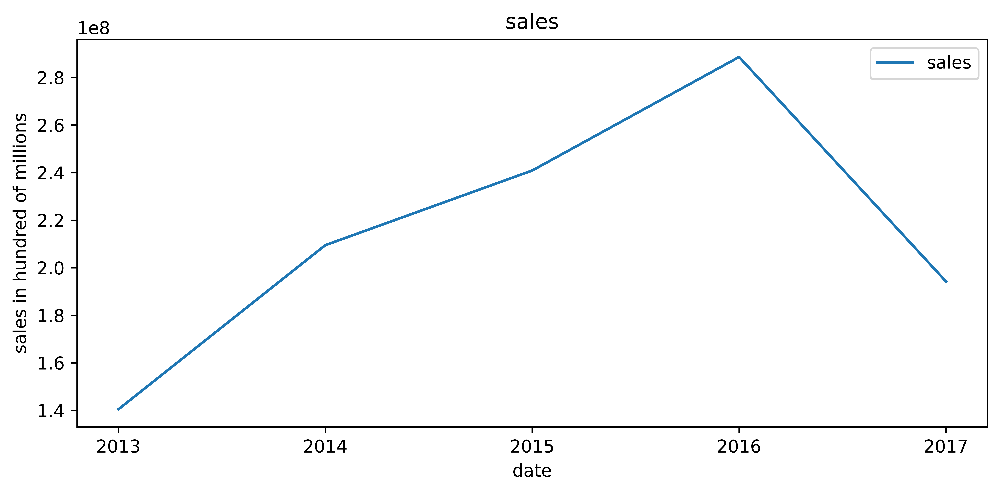

In [21]:
fig, ax = plt.subplots(figsize=(8, 4), dpi=1000)

# fig = fig(figsize=(8, 6), dpi=80)
year_sales = df_sales.groupby(by=df_sales.index.get_level_values(2).year)['sales'].sum()

ax.plot(year_sales.index.to_list(), year_sales.values, label="sales")

ax.legend()

ax.set_xticks([2013, 2014, 2015, 2016, 2017])

ax.set_title('sales')
ax.set_xlabel('date')
ax.set_ylabel('sales in hundred of millions')

plt.tight_layout()
plt.show()
fig.savefig('sales.png')

### plotting avarege year sales for each category

In [22]:
sales_single_index = df_sales.copy().reset_index(level=[0,1])
categories = pd.unique(sales_single_index.family)

figure = plt.figure(figsize=(12, 30), dpi=1000)

for i, category in zip(range(1,34), categories):
    df_sales_category = sales_single_index[sales_single_index.family == category]
    year_sales = df_sales_category.groupby(by=df_sales_category.index.year)['sales'].sum()
    ax = figure.add_subplot(11, 3, i)
    ax.plot(year_sales.index, year_sales.values, label="sales")
    ax.set_xticks([2013, 2014, 2015, 2016, 2017])
    ax.set_title('Sales for ' + category)
    ax.set_xlabel('date')
    ax.set_ylabel('sales')
    
plt.tight_layout()    
plt.show()
figure.savefig('salesForEachCategory.png')

### plotting monthly and yearly sesonality

In [23]:
# credit for this method goes to Ryan Holbrook in his kaggle time series turorials 
# https://www.kaggle.com/ryanholbrook/seasonality
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax

In [24]:
# taking the daily avarge sale for all families in all the stores in the year 2017
daily_sales = (
    df_sales.sales
    .groupby(by= df_sales.index.get_level_values(2)).mean()
    .squeeze().loc['2017']
).to_frame()

daily_sales["week"] = daily_sales.index.week
daily_sales["day"] = daily_sales.index.dayofweek

In [25]:
# a copy of sales to add both year and day of year columns, to use for plotting seasonality
sales_copy = df_sales.copy()

sales_copy["year"] = sales_copy.index.get_level_values(2).year
sales_copy["dayofyear"] = sales_copy.index.get_level_values(2).dayofyear

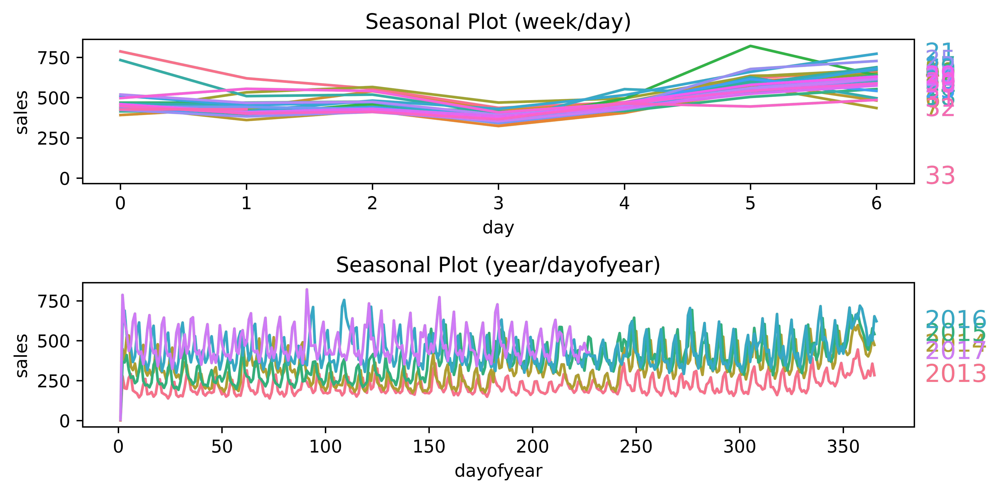

In [26]:
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(8, 4), dpi=1000)

seasonal_plot(daily_sales, y="sales", period="week", freq="day", ax=ax0)
seasonal_plot(sales_copy, y="sales", period="year", freq="dayofyear", ax=ax1);

plt.tight_layout()    
plt.show()
fig.savefig('sesonality.png')

### plotting periodogram

In [27]:
# credit for this method goes to Ryan Holbrook in his kaggle time series turorials 
# https://www.kaggle.com/ryanholbrook/seasonality
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 6), dpi=1000)
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

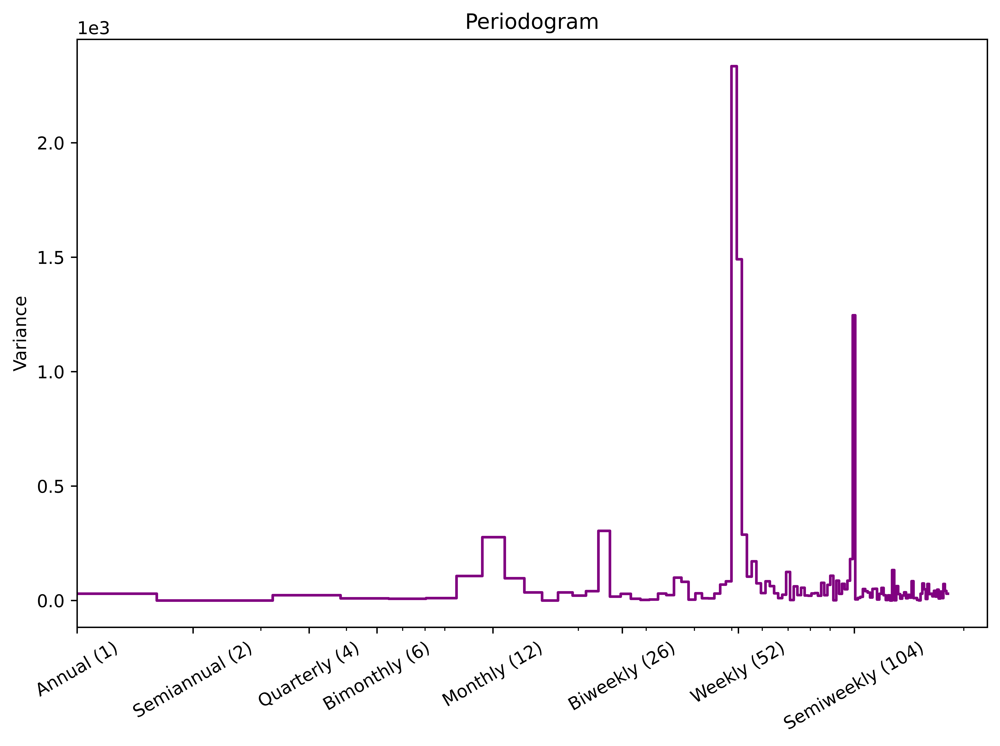

In [28]:
plot_periodogram(daily_sales.sales)

plt.tight_layout()    
plt.show()

# feature engineering 

## comparing a few ways to merge the dataframes:

#### using apply method

In [29]:
def proccess_oil_prices(x):
    try:
        # if oil price exsits for sales date return the fist found price 
        return (df_oil.dcoilwtico[df_oil.index == x.name[2]].iloc[0]) 
    except IndexError:
        # if oil price doesn't exsits for sales date return None
        return None

In [30]:
%%timeit
sales_date_oil_price = df_sales.apply(proccess_oil_prices,axis=1)

7min 15s ± 1.01 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


#### iterating over the dataframe rows

In [31]:
%%timeit
sales_date_oil_price = []
for index, sale in df_sales.iterrows():
    try:
        # if oil price exsits for sales date append the fist found price to the tomporary list
        sales_date_oil_price.append(df_oil.dcoilwtico[df_oil.index == sale.name[2]].iloc[0]) 
    except IndexError:
        # if oil price doesn't exsits for sales date append None to the tomporary list
        sales_date_oil_price.append(None)

9min 12s ± 1.77 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


#### using list comprehension

In [32]:
def proccess_oil_prices(date):
    try:
        # if oil price exsits for sales date append the fist found price to the tomporary list
        return (df_oil.dcoilwtico[df_oil.index == date].iloc[0]) 
    except IndexError:
        # if oil price doesn't exsits for sales date append None to the tomporary list
        return None

In [33]:
%%timeit
sales_date_oil_price = [proccess_oil_prices(date) for date in df_sales.index.levels[2]]

242 ms ± 1.39 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


#### using join method

In [34]:
%%timeit
df = df_sales.join(df_oil)

40.3 ms ± 538 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


## comparison result:
it's clear that join method is the fastest by a large diffrence, and sadly it was the last one to occure to me, but it was a fun experience, it made see for myself that dealing with a dataframe by iterating is the last option to take and only if no other option is available, since it was the slowest with an avarge of 9 mins, compared to apply method iterating the dataframe is almost 50% slower, the bigger the task the bigger this diffrence would be.
the other two method which was both simpler and faster than iterating the dataframe with only an avarage of around 7 minutes for apply method, and an avarage of around 243ms for list comprehension that made it the second fastest way to merge.

but in the end I would use join method for it's speed, and also easier joining based on multiple columns.

## preparing training features

In [35]:
y = df_sales.copy()
y.drop('onpromotion', axis=1, inplace=True)
y = y.unstack(['family', 'store_nbr']).loc['2017-02-15':]
y

sales                                                \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
store_nbr           1         1      1         1     1            1   
date                                                                  
2017-02-15        3.0       0.0    3.0    2141.0   0.0   494.802002   
2017-02-16        3.0       0.0    0.0    1866.0   3.0   398.752991   
2017-02-17        7.0       0.0    4.0    2286.0   1.0   431.773010   
2017-02-18        3.0       0.0    8.0    2906.0   0.0   471.920990   
2017-02-19        0.0       0.0    1.0    1019.0   0.0   146.619003   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0   145.606995   
2017-08-12        6.0       0.0    3.0    1659.0   0.0   243.220001   
2017-08-13        1.0       0.0    1.0     803.0   0.0   136.679001   
2017-08-14        1.0       0.0    6.0    2201.0   0.0   346.037994   
2017-08-15        4.0       0.0    4.0    1942.0   0.0   329.541016   

                                                    ...                        \
family     CELEBRATION CLEANING  DAIRY        DELI  ... MAGAZINES       MEATS   
store_nbr            1        1      1           1  ...         9           9   
date                                                ...                         
2017-02-15        26.0    828.0  863.0  149.341995  ...       4.0  359.859009   
2017-02-16        18.0    668.0  725.0  104.388000  ...       4.0  602.231995   
2017-02-17        16.0    765.0  840.0  180.781998  ...       6.0  277.169006   
2017-02-18        13.0    691.0  963.0  187.018005  ...      10.0  463.011993   
2017-02-19         1.0    225.0  366.0   68.066002  ...       8.0  330.872009   
...                ...      ...    ...         ...  ...       ...         ...   
2017-08-11         4.0    341.0  343.0   64.302002  ...       5.0  309.244995   
2017-08-12         3.0    351.0  526.0   99.487999  ...       2.0  260.298004   
2017-08-13         1.0    169.0  266.0   47.770000  ...       3.0  327.205994   
2017-08-14         4.0    571.0  699.0  154.578003  ...      12.0  330.975006   
2017-08-15        21.0    703.0  602.0  116.402000  ...      11.0  449.227997   

                                                                           \
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS     POULTRY   
store_nbr              9            9                       9           9   
date                                                                        
2017-02-15         377.0          9.0                    15.0  303.273010   
2017-02-16         416.0          6.0                     5.0  339.653992   
2017-02-17         317.0          6.0                    16.0  397.450012   
2017-02-18         667.0          5.0                    18.0  576.296997   
2017-02-19         520.0          7.0                     8.0  383.841003   
...                  ...          ...                     ...         ...   
2017-08-11         373.0         11.0                     2.0  525.223999   
2017-08-12         400.0          7.0                    10.0  383.386993   
2017-08-13         510.0          2.0                     9.0  412.458008   
2017-08-14         445.0          2.0                    14.0  283.428986   
2017-08-15         522.0          6.0                     6.0  438.132996   

                                                                              
family     PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES    SEAFOOD  
store_nbr               9            9                          9          9  
date                                                                          
2017-02-15     103.694000  1334.305054                        3.0  16.000000  
2017-02-16      91.000000  1366.176025                        0.0  17.000000  
2017-02-17      86.417999  1048.452026                        0.0  12.000000  
2017-02-18     220.404999

In [36]:
fourier = CalendarFourier(freq='M', order=4)

dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=True,
    additional_terms=[fourier],
    drop=True,
)

X = dp.in_sample()

In [37]:
# joining with other data sets
X = X.join(df_oil)
X = X.fillna(X['dcoilwtico'].mean())
X = X.join(df_holiday)
X = X.groupby(['date']).first()
X = X.fillna(0.0)

In [38]:
X_train,y_train = X[:'2017-07-31'], y[:'2017-07-31']
X_valdition, y_valdition = X['2017-08-01':], y['2017-08-01':]

## preparing testing features

In [39]:
X_test = dp.out_of_sample(steps=16)

X_test.index.name = 'date'
X_test = X_test.join(df_oil)
X_test = X_test.fillna(X['dcoilwtico'].mean())
X_test = X_test.join(df_holiday)
X_test = X_test.groupby(['date']).first()
X_test = X_test.fillna(0.0)

# training and validating

In [40]:
# method to calculate each model train and validation rmsle score
def RMSLE_Score(model, X_train, X_valdition, results=True):
    y_pred = model.predict(X_valdition)
    y_fit = model.predict(X_train)

    # clipping to make sure no negative sales exists and to use MSLE method without an exception raising
    y_pred = y_pred.clip(0.0) 
    y_fit = y_fit.clip(0.0)

    # model RMSLE score
    train_rmsle = np.sqrt(mean_squared_log_error(y_train, y_fit))
    validation_rmsle = np.sqrt(mean_squared_log_error(y_valdition, y_pred))
    if results:
        print((f'Train RMSLE: {train_rmsle:.2f}\n'  f'validation RMSLE: {validation_rmsle:.2f}'))
    if not results:
        return train_rmsle, validation_rmsle

In [41]:
# method used to seach for the best parameter value for a model and thus tuning that parameter
def parameter_tuning(tuning_model=None, para=None, para_list=None, multioutput=False, **kwargs):
    train_list = []
    validation_list = []
    for i in range(len(para_list)):
        kwargs[para] = para_list[i]
        if not multioutput:
            model = tuning_model(**kwargs)
        else:
            model = MultiOutputRegressor(tuning_model(**kwargs))
        model.fit(X_train, y_train)

        train, validation = RMSLE_Score(model, X_train, X_valdition, results=False)
        
        train_list.append(train)
        validation_list.append(validation)
        
    return train_list, validation_list

## Benchmark model :LinearRegression

In [42]:
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.53
validation RMSLE: 0.58


## Lasso

In [43]:
alpha_list = [round(1 - (0.1*x), 2) for x in range(9)] # create values from 1 to 0.2 with an decrement of 0.1
alpha_list.extend([x for x in range(1,10)]) # add values from 1 to 9 with an increment of 1
train_list, validation_list = parameter_tuning(
    tuning_model=Lasso,     # model to tune
    para='alpha',           # parameter to be tuned
    para_list=alpha_list,   # list of possible values for the parameter 
    # extra static parameters for the model
    fit_intercept=False, 
    max_iter= 100000
)

c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality g

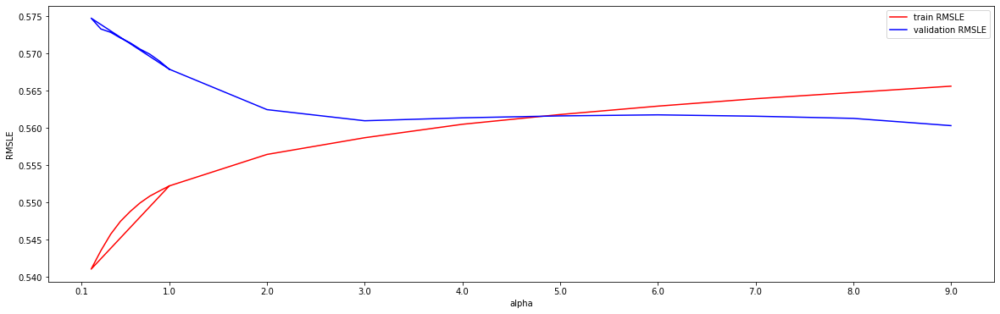

In [44]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(alpha_list, train_list, color='red', label='train RMSLE')
ax.plot(alpha_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ticks = [x for x in range(1,10)]
ticks.append(0.1)
ax.set_xticks(ticks)
ax.set_xlabel('alpha')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('lasso')

In [45]:
model = Lasso(fit_intercept=False, max_iter= 100000, alpha=3)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)


Train RMSLE: 0.56
validation RMSLE: 0.56


## Ridge

In [46]:
alpha_list = [x for x in range(1,60)]
train_list, validation_list = parameter_tuning(
    tuning_model=Ridge,     # model to tune
    para='alpha',           # parameter to be tuned
    para_list=alpha_list,   # list of possible values for the parameter 
    # extra static parameters for the model
    fit_intercept=False, 
    max_iter= 100000
)

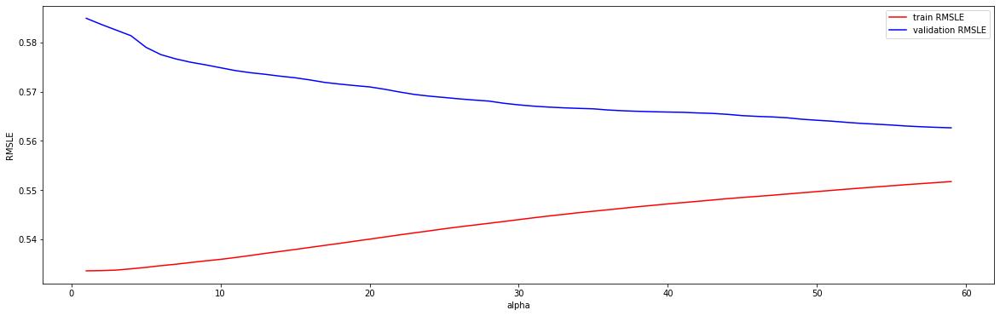

In [47]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(alpha_list, train_list, color='red', label='train RMSLE')
ax.plot(alpha_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('alpha')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('Ridge')

In [48]:
model = Ridge(fit_intercept=False, max_iter= 100000, alpha=50)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.55
validation RMSLE: 0.56


## ElasticNet

In [49]:
alpha_list = [round(1 - (0.1*x), 2) for x in range(9)] # create values from 1 to 0.2 with an decrement of 0.1

train_list, validation_list = parameter_tuning(
    tuning_model=ElasticNet, # model to tune
    para='alpha',            # parameter to be tuned
    para_list=alpha_list,    # list of possible values for the parameter 
    # extra static parameters for the model
    fit_intercept=False, 
    max_iter= 100000
)

c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality g

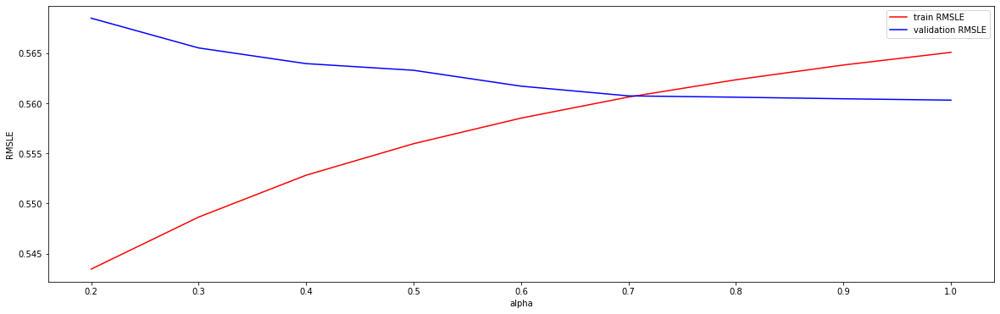

In [50]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(alpha_list, train_list, color='red', label='train RMSLE')
ax.plot(alpha_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('alpha')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('ElasticNet')

In [51]:
model = ElasticNet(fit_intercept=False, max_iter= 100000, alpha=0.6)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

c:\users\meshari\anaconda3\envs\deep-learning\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)


Train RMSLE: 0.56
validation RMSLE: 0.56


## SVR

In [52]:
model = MultiOutputRegressor(SVR())

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.59
validation RMSLE: 0.56


## KNeighborsRegressor

In [53]:
neighbor_list = [x for x in range(1, 15)] # create values from 1 to 14 with an increment of 1

train_list, validation_list = parameter_tuning(
    tuning_model=KNeighborsRegressor,  # model to tune
    para='n_neighbors',                    # parameter to be tuned
    para_list=neighbor_list,                # list of possible values for the parameter 
)

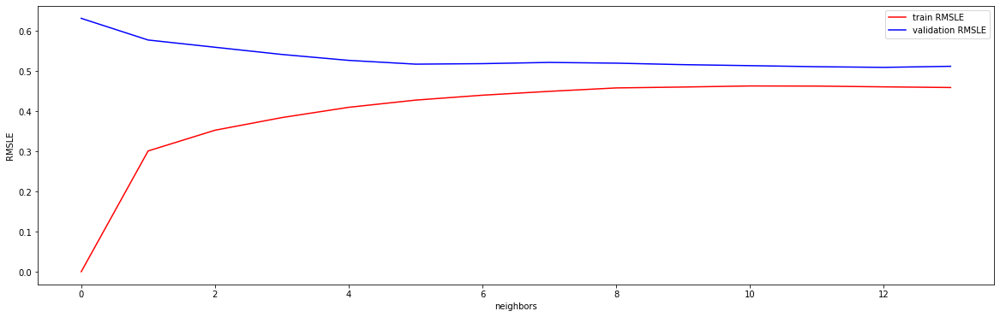

In [54]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(train_list, color='red', label='train RMSLE')
ax.plot(validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('neighbors')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('KNeighborsRegressor')

In [55]:
model = KNeighborsRegressor(n_neighbors=10)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.46
validation RMSLE: 0.52


## DecisionTreeRegressor

In [56]:
depth_list = [x for x in range(1, 5)] # create values from 1 to 4 with an increment of 1

train_list, validation_list = parameter_tuning(
    tuning_model=DecisionTreeRegressor,  # model to tune
    para='max_depth',                    # parameter to be tuned
    para_list=depth_list,                # list of possible values for the parameter 
)

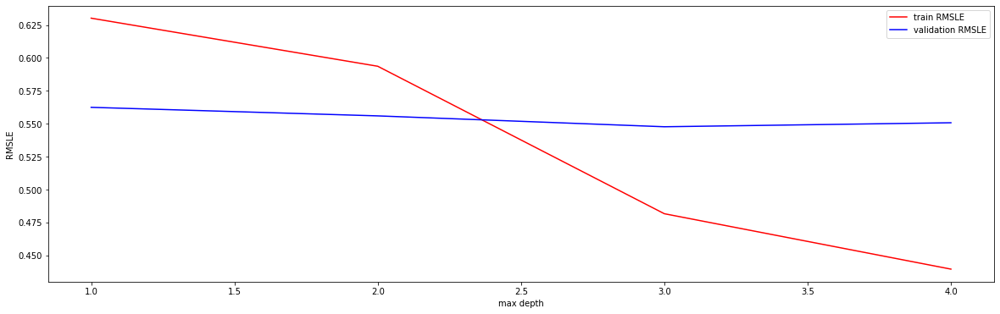

In [57]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(depth_list, train_list, color='red', label='train RMSLE')
ax.plot(depth_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('max depth')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('DecisionTreeRegressor')

In [58]:
model = DecisionTreeRegressor(max_depth=3)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.48
validation RMSLE: 0.55


## RandomForestRegressor

In [59]:
depth_list = [x for x in range(1, 6)] # create values from 1 to 5 with an increment of 1

train_list, validation_list = parameter_tuning(
    tuning_model=RandomForestRegressor,  # model to tune
    para='max_depth',                    # parameter to be tuned
    para_list=depth_list,                # list of possible values for the parameter 
    # extra static parameters for the model
    n_jobs = -1
)

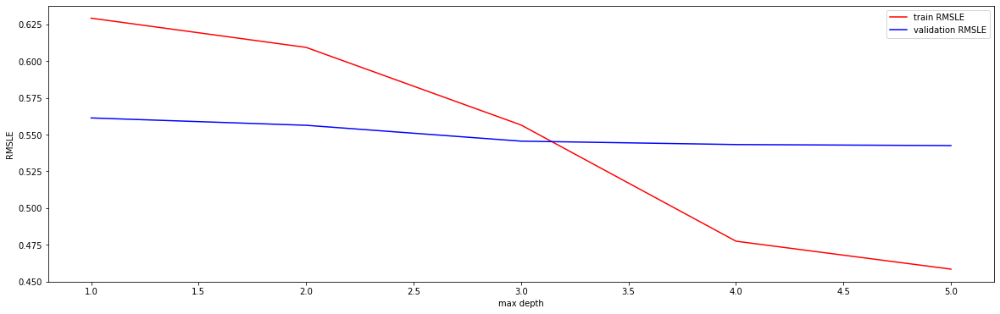

In [60]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(depth_list, train_list, color='red', label='train RMSLE')
ax.plot(depth_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('max depth')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('RandomForestRegressor')

In [61]:
model = RandomForestRegressor(max_depth=4)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.49
validation RMSLE: 0.54


## ExtraTreesRegressor

In [62]:
depth_list = [x for x in range(1, 10)] # create values from 1 to 9 with an increment of 1

train_list, validation_list = parameter_tuning(
    tuning_model=ExtraTreesRegressor,  # model to tune
    para='max_depth',                  # parameter to be tuned
    para_list=depth_list,              # list of possible values for the parameter 
    # extra static parameters for the model
    n_jobs = -1
)

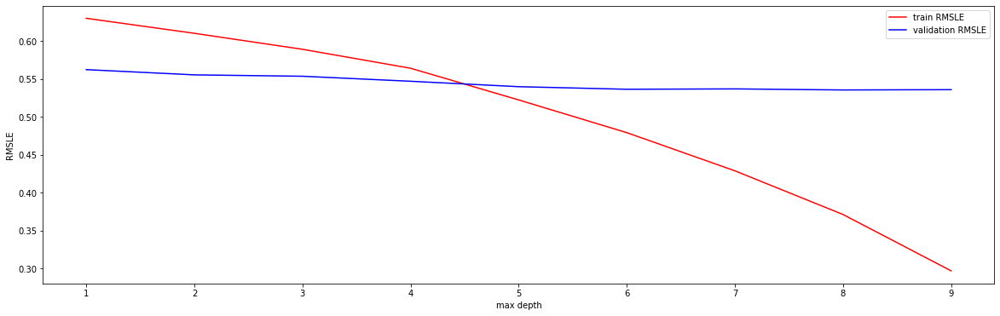

In [63]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(depth_list, train_list, color='red', label='train RMSLE')
ax.plot(depth_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('max depth')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('ExtraTreesRegressor')

In [64]:
model = ExtraTreesRegressor(max_depth=6)

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.48
validation RMSLE: 0.54


## XGBRegressor

In [65]:
lr_list = [round(1 - (0.1*x), 2) for x in range(10)] # create values from 1 to 0.1 with an decrement of 0.1 each turn
lr_list.extend([round(0.1 ** (x), x) for x in range(2,5)]) # add values from 0.01 to 1e-4 with a division by 10 each turn
train_list, validation_list = parameter_tuning(
    tuning_model=XGBRegressor,      # model to tune
    para='learning_rate',           # parameter to be tuned
    para_list=lr_list,              # list of possible values for the parameter 
    multioutput=True,               # making sure the model is warped in a MultiOutputRegressor
    # extra static parameters for the model
    gamma = 1,
    max_depth = 3,
    n_jobs = -1,
)

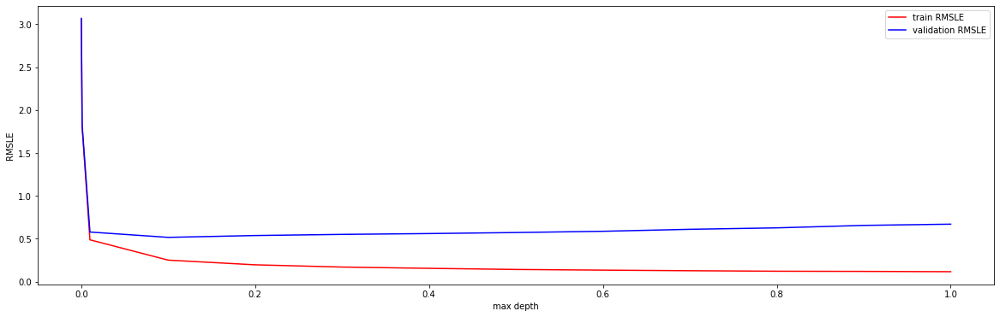

In [66]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(lr_list, train_list, color='red', label='train RMSLE')
ax.plot(lr_list, validation_list, color='blue', label='validation RMSLE')
ax.legend()
ax.set_xlabel('max depth')
ax.set_ylabel('RMSLE')
plt.show()
fig.savefig('XGBRegressor')

In [67]:
model = MultiOutputRegressor(XGBRegressor(learning_rate = 0.1, gamma = 5, max_depth = 3, n_jobs = -1))

model.fit(X_train, y_train)

RMSLE_Score(model, X_train, X_valdition)

Train RMSLE: 0.28
validation RMSLE: 0.51


# training and validating conclusion:
it's clear that the best three models are:

3) ExtraTreesRegressor with a validation RMSLE of 0.54 and a Training RMSLE of 0.48.

2) KNeighborsRegressor with a validation RMSLE of 0.52 and a Training RMSLE of 0.46.

1) XGBRegressor with a validation RMSLE of 0.51 and a Train RMSLE of 0.28.


finnaly, it's obvious that the tree based models has actually outperformerd the linear models.

In [68]:
model = MultiOutputRegressor(XGBRegressor())

model.fit(X_train, y_train)

y_pred = model.predict(X_valdition)
y_fit = model.predict(X_train)

# clipping to make sure no negative sales exists and to use MSLE method without an exception raising
y_pred = y_pred.clip(0.0) 
y_fit = y_fit.clip(0.0)

### making sure that the prediction has correctly captured the seasonality

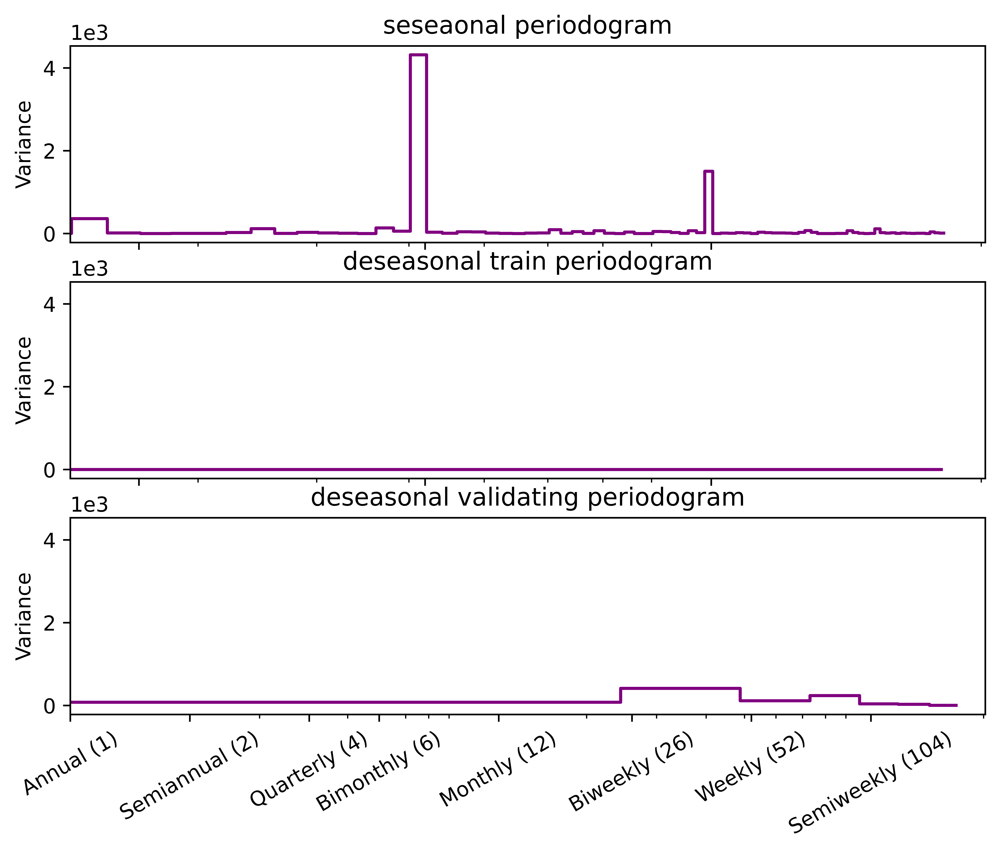

In [69]:
y_seseaonal = y.stack(['store_nbr', 'family'])
y_seseaonal = y_seseaonal.groupby(y_seseaonal.index.get_level_values(0)).mean().squeeze()

y_deseason_train = y_train - y_fit
y_deseason_train = y_deseason_train.stack(['store_nbr', 'family'])
y_deseason_train = y_deseason_train.groupby(y_deseason_train.index.get_level_values(0)).mean().squeeze()

y_deseason_test = y_valdition - y_pred
y_deseason_test = y_deseason_test.stack(['store_nbr', 'family'])
y_deseason_test = y_deseason_test.groupby(y_deseason_test.index.get_level_values(0)).mean().squeeze()

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, sharey=True, figsize=((8, 6)), dpi=1000)
ax1 = plot_periodogram(y_seseaonal, ax=ax1)
ax1.set_title('seseaonal periodogram')
ax2 = plot_periodogram(y_deseason_train, ax=ax2)
ax2.set_title('deseasonal train periodogram')
ax2 = plot_periodogram(y_deseason_test, ax=ax3)
ax2.set_title('deseasonal validating periodogram')
plt.show()

Although the model has learned the seasonality of the training data pretty well, but we can actaully see that for the validation data which is a two weeek ahead of the training data, there is still Biweekly and weekly seasonality that the model wasn't able to completely forecast.

# testing the best 3 models

if you want to check out the results you can submit the resulting file by joining the competition:

https://www.kaggle.com/c/store-sales-time-series-forecasting/overview

## Benchmark model :LinearRegression

In [70]:
# initializing the model and training it
model = LinearRegression(fit_intercept=False)

model.fit(X, y)

LinearRegression(fit_intercept=False)

### using the model to make prediction in the test set, and submit the result to kaggle competetion

In [71]:
# predicting test set using the trained model and saving the results to submit to kaggle competetion
y_submit = pd.DataFrame(
    model.predict(X_test),
    index=X_test.index,
    columns=y.columns
)

y_submit = y_submit.stack(['store_nbr', 'family'])
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('LinearRegression.csv', index=False)

In [72]:
y_submit

id        sales
date       store_nbr family                                          
2017-08-16 1         AUTOMOTIVE                  3000888     4.018775
                     BABY CARE                   3000889     0.000000
                     BEAUTY                      3000890     3.880922
                     BEVERAGES                   3000891  2471.756937
                     BOOKS                       3000892     0.501568
...                                                  ...          ...
2017-08-31 9         POULTRY                     3029395   387.659434
                     PREPARED FOODS              3029396    97.956214
                     PRODUCE                     3029397  1292.655252
                     SCHOOL AND OFFICE SUPPLIES  3029398    56.364060
                     SEAFOOD                     3029399    17.334381

[28512 rows x 2 columns]

### result: 0.49920 (RMSLE)





## ExtraTreesRegressor

In [73]:
# initializing the model and training it
model = ExtraTreesRegressor(max_depth=6)

model.fit(X, y)

ExtraTreesRegressor(max_depth=6)

### using the model to make prediction in the test set, and submit the result to kaggle competetion

In [74]:
# predicting test set using the trained model and saving the results to submit to kaggle competetion
y_submit = pd.DataFrame(
    model.predict(X_test),
    index=X_test.index,
    columns=y.columns
)

y_submit = y_submit.stack(['store_nbr', 'family'])
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('ExtraTreesRegressor.csv', index=False)

In [75]:
y_submit

id        sales
date       store_nbr family                                          
2017-08-16 1         AUTOMOTIVE                  3000888     4.104710
                     BABY CARE                   3000889     0.000000
                     BEAUTY                      3000890     3.630944
                     BEVERAGES                   3000891  2446.322132
                     BOOKS                       3000892     0.521603
...                                                  ...          ...
2017-08-31 9         POULTRY                     3029395   355.103267
                     PREPARED FOODS              3029396    99.164721
                     PRODUCE                     3029397  1260.964753
                     SCHOOL AND OFFICE SUPPLIES  3029398    26.818420
                     SEAFOOD                     3029399    16.451382

[28512 rows x 2 columns]

### result: 0.47770 (RMSLE)





## KNeighborsRegressor

In [76]:
# initializing the model and training it
model = KNeighborsRegressor(n_neighbors=10)

model.fit(X, y)

KNeighborsRegressor(n_neighbors=10)

### using the model to make prediction in the test set, and submit the result to kaggle competetion

In [77]:
# predicting test set using the trained model and saving the results to submit to kaggle competetion
y_submit = pd.DataFrame(
    model.predict(X_test),
    index=X_test.index,
    columns=y.columns
)

y_submit = y_submit.stack(['store_nbr', 'family'])
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('KNeighborsRegressor.csv', index=False)

In [78]:
y_submit

id        sales
date       store_nbr family                                          
2017-08-16 1         AUTOMOTIVE                  3000888     5.200000
                     BABY CARE                   3000889     0.000000
                     BEAUTY                      3000890     4.500000
                     BEVERAGES                   3000891  1933.900024
                     BOOKS                       3000892     0.000000
...                                                  ...          ...
2017-08-31 9         POULTRY                     3029395   416.510803
                     PREPARED FOODS              3029396   117.403198
                     PRODUCE                     3029397  1542.543945
                     SCHOOL AND OFFICE SUPPLIES  3029398   153.699997
                     SEAFOOD                     3029399    18.490900

[28512 rows x 2 columns]

### result: 0.45739 (RMSLE)

## XGBRegressor

In [79]:
# initializing the model and training it
model = MultiOutputRegressor(XGBRegressor(learning_rate = 0.1, gamma = 5, max_depth = 3, n_jobs = -1))

model.fit(X, y)

MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            enable_categorical=False, gamma=5,
                                            gpu_id=None, importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.1,
                                            max_delta_step=None, max_depth=3,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=-1,
                                            num_parallel_tree=None,
                                            predictor=None

### using the model to make prediction in the test set, and submit the result to kaggle competetion

In [80]:
# predicting test set using the trained model and saving the results to submit to kaggle competetion
y_submit = pd.DataFrame(
    model.predict(X_test),
    index=X_test.index,
    columns=y.columns
)

y_submit = y_submit.stack(['store_nbr', 'family'])
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('XGBRegressor.csv', index=False)

In [81]:
y_submit

id        sales
date       store_nbr family                                          
2017-08-16 1         AUTOMOTIVE                  3000888     2.717307
                     BABY CARE                   3000889     0.000014
                     BEAUTY                      3000890     3.666007
                     BEVERAGES                   3000891  2254.311768
                     BOOKS                       3000892     0.335593
...                                                  ...          ...
2017-08-31 9         POULTRY                     3029395   376.619293
                     PREPARED FOODS              3029396    97.810959
                     PRODUCE                     3029397  1126.713379
                     SCHOOL AND OFFICE SUPPLIES  3029398   164.528229
                     SEAFOOD                     3029399    14.872448

[28512 rows x 2 columns]

### result: 0.45554 (RMSLE)

# testing conclusion:
the testing results confirm the same order as the training and validation results